#**Read All CSV Files From Github**


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
cd '/content/drive/Shareddrives/Data Mining/'

/content/drive/Shareddrives/Data Mining


In [ ]:
#Setup environment
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import dates
import datetime


In [ ]:
!pip install geopandas

## **Cases and Testing**

In [ ]:
#cases_mysia_url = 'https://raw.githubusercontent.com/MoH-Malaysia/covid19-public/main/epidemic/cases_malaysia.csv'
cases_mysia_url = '/content/drive/Shareddrives/Data Mining/files/cases_malaysia.csv'
df_cases_mysia = pd.read_csv(cases_mysia_url)
df_cases_mysia.head()

,date,cases_new,cases_import,cases_recovered,cluster_import,cluster_religious,cluster_community,cluster_highRisk,cluster_education,cluster_detentionCentre,cluster_workplace
0,2020-01-25,4,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-01-26,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-01-27,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-01-28,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-01-29,3,3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#test_mysia_url = 'https://raw.githubusercontent.com/MoH-Malaysia/covid19-public/main/epidemic/tests_malaysia.csv'
test_mysia_url = '/content/drive/Shareddrives/Data Mining/files/tests_malaysia.csv'
df_test_mysia = pd.read_csv(test_mysia_url)
df_test_mysia.head()

,date,rtk-ag,pcr
0,2020-01-24,0,2
1,2020-01-25,0,5
2,2020-01-26,0,14
3,2020-01-27,0,24
4,2020-01-28,0,53


In [ ]:
#clusters_url = 'https://raw.githubusercontent.com/MoH-Malaysia/covid19-public/main/epidemic/clusters.csv'
clusters_url = '/content/drive/Shareddrives/Data Mining/files/clusters.csv'
df_clusters = pd.read_csv(clusters_url)
df_clusters.head()

,cluster,state,district,date_announced,date_last_onset,category,status,cases_new,cases_total,cases_active,tests,icu,deaths,recovered
0,Kluster Warga Jepun,WP Kuala Lumpur,Lembah Pantai,2020-03-01,2020-03-09,import,ended,0,3,0,267,0,0,3
1,Kluster UDA,"WP Kuala Lumpur, WP Putrajaya, Selangor, Neger...",Pelbagai,2020-03-04,2020-03-01,import,ended,0,144,0,1864,0,2,142
2,Kluster Keagamaan (Tabligh SP),Semua Negeri,Pelbagai,2020-03-13,2020-03-11,religious,ended,0,2022,0,42023,0,34,1988
3,Kluster Tabligh New Delhi,"Selangor, Negeri Sembilan, WP Kuala Lumpur & W...",Pelbagai,2020-03-16,2020-03-20,import,ended,0,24,0,57,0,0,24
4,Kluster AIROD,Pahang,Kuantan,2020-03-31,2020-03-31,workplace,ended,0,65,0,734,0,0,65


In [ ]:
#cases_state_url = 'https://raw.githubusercontent.com/MoH-Malaysia/covid19-public/main/epidemic/cases_state.csv'
cases_state_url = '/content/drive/Shareddrives/Data Mining/files/cases_state.csv'
df_cases_state = pd.read_csv(cases_state_url)
df_cases_state.head()

,date,state,cases_import,cases_new,cases_recovered
0,2020-01-25,Johor,4,4,0
1,2020-01-25,Kedah,0,0,0
2,2020-01-25,Kelantan,0,0,0
3,2020-01-25,Melaka,0,0,0
4,2020-01-25,Negeri Sembilan,0,0,0


In [ ]:
#test_state_url = 'https://raw.githubusercontent.com/MoH-Malaysia/covid19-public/main/epidemic/tests_state.csv'
test_state_url = '/content/drive/Shareddrives/Data Mining/files/tests_state.csv'
df_test_state = pd.read_csv(test_state_url)
df_test_state.head()

,date,state,rtk-ag,pcr
0,2021-07-01,Johor,2749,3670
1,2021-07-01,Kedah,2073,1297
2,2021-07-01,Kelantan,1348,1966
3,2021-07-01,Melaka,1049,2132
4,2021-07-01,Negeri Sembilan,2151,3306


# **Question 1:Explore data and do EDA**

In [ ]:
#Shape of dataset
print("Shape of testing in Malaysia:",df_test_mysia.shape)
print("Shape of testing in state:",df_test_state.shape)
print("Shape of cases in state:",df_cases_state.shape)
print("Shape of cases in Malaysia:",df_cases_mysia.shape)
print("Shape of cluster:",df_clusters.shape)

Shape of testing in Malaysia: (603, 3)
Shape of testing in state: (1264, 4)
Shape of cases in state: (9680, 5)
Shape of cases in Malaysia: (605, 11)
Shape of cluster: (5282, 14)


In [ ]:
#Missing value of dataset
t = pd.DataFrame(df_test_mysia.isna().sum(),columns =['Testing_Malaysia missing value'])
t1 = pd.DataFrame(df_test_state.isna().sum(),columns =['Testing_state missing value'])
t2 = pd.DataFrame(df_cases_mysia.isna().sum(),columns =['Cases_Malaysia missing value'])
t3 = pd.DataFrame(df_cases_state.isna().sum(),columns =['Cases_State missing value'])
t4 = pd.DataFrame(df_clusters.isna().sum(),columns =['Cluster missing value'])

In [ ]:
#Merge dataset that is related
df_msia=df_cases_mysia.merge(df_test_mysia, left_on=['date'], right_on=['date'], how='left')
df_state=df_cases_state.merge(df_test_state, left_on=['date','state'], right_on=['date','state'], how='left')

In [ ]:
#fill NaN value to 0
df_msia.fillna(0,inplace=True)
df_state.fillna(0,inplace=True)

In [ ]:
#seperate year month
df_msia["year_month"] = pd.to_datetime(df_msia["date"], format='%Y-%m-%d').apply(lambda x: x.strftime('%Y-%m'))
df_state["year_month"] = pd.to_datetime(df_state["date"], format='%Y-%m-%d').apply(lambda x: x.strftime('%Y-%m'))
df_msia["month"] = pd.to_datetime(df_msia["date"], format='%Y-%m-%d').apply(lambda x: x.strftime('%m'))
df_msia["year"] = pd.to_datetime(df_msia["date"], format='%Y-%m-%d').apply(lambda x: x.strftime('%Y'))
df_state["month"] = pd.to_datetime(df_state["date"], format='%Y-%m-%d').apply(lambda x: x.strftime('%m'))
df_state["year"] = pd.to_datetime(df_state["date"], format='%Y-%m-%d').apply(lambda x: x.strftime('%Y'))
df_clusters["a_month"] = pd.to_datetime(df_clusters["date_announced"], format='%Y-%m-%d').apply(lambda x: x.strftime('%m'))
df_clusters["a_year"] = pd.to_datetime(df_clusters["date_announced"], format='%Y-%m-%d').apply(lambda x: x.strftime('%Y'))
df_clusters["a_year_month"] = pd.to_datetime(df_clusters["date_announced"], format='%Y-%m-%d').apply(lambda x: x.strftime('%Y-%m'))

In [ ]:
#whole timeline of the dataset
print ("Date period of cases malaysia dataset ==> " +df_cases_mysia['date'].unique()[0]+" to "+df_cases_mysia['date'].unique()[-1])

Date period of cases malaysia dataset ==> 2020-01-25 to 2021-09-20


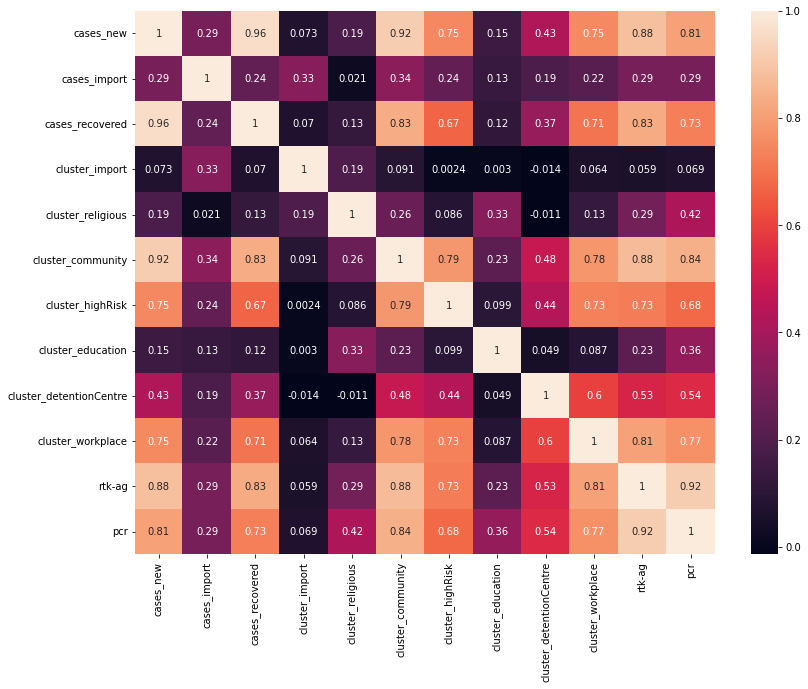

In [ ]:
#correlation between every column in df_msia
plt.figure(figsize=(13,10))
sns.heatmap(df_msia.corr(), annot=True);

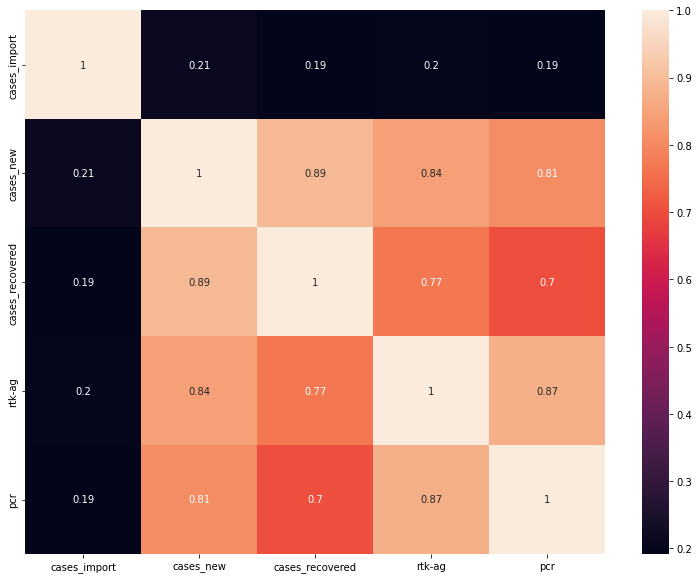

In [ ]:
#correlation between every column in df_msia
plt.figure(figsize=(13,10))
sns.heatmap(df_state.corr(), annot=True);

 **Whole timeline plot by day**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


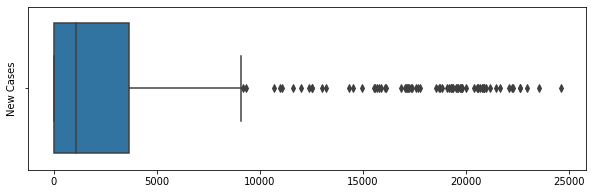

In [ ]:
#Boxplot of new cases every day
plt.figure(figsize=(10,3))
g=sns.boxplot(df_msia['cases_new'])
g.set(xlabel=None) 
g.set(ylabel="New Cases") 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


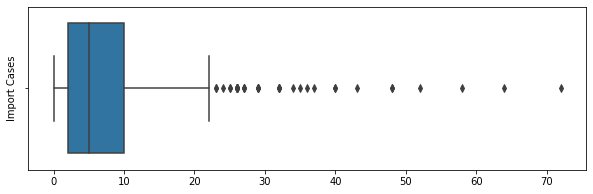

In [ ]:
#Boxplot of import cases every day
plt.figure(figsize=(10,3))
g=sns.boxplot(df_msia['cases_import'])
g.set(xlabel=None) 
g.set(ylabel="Import Cases") 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


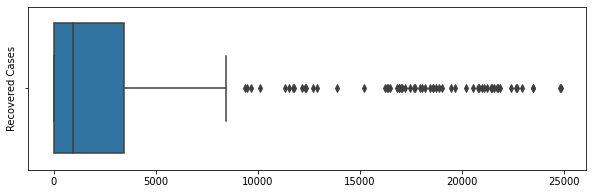

In [ ]:
#Boxplot of recovered cases every day
plt.figure(figsize=(10,3))
g=sns.boxplot(df_msia['cases_recovered'])
g.set(xlabel=None) 
g.set(ylabel="Recovered Cases") 
plt.show()

[Text(0, 0.5, 'Total')]

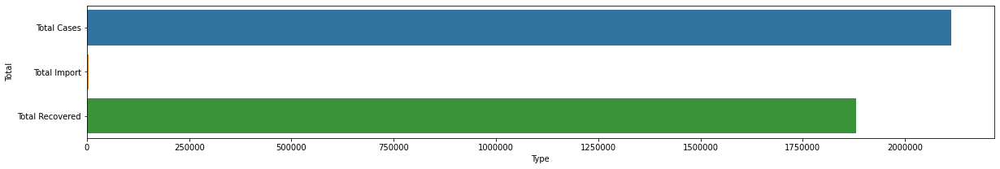

In [ ]:
#relationship between import cases, new cases ,recovered cases and active cases 
total_cases = df_msia['cases_new'].sum()
total_recovered = df_msia['cases_recovered'].sum()
total_import = df_msia['cases_import'].sum()
data = {'Type': ['Total Cases', 'Total Import', 'Total Recovered'], 'Total': [total_cases,total_import,total_recovered]}  
sum_df =pd.DataFrame(data = data,columns = ['Type','Total'])
plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
g=sns.barplot(x='Total',y='Type',data=sum_df)
g.set(xlabel='Type') 
g.set(ylabel='Total') 

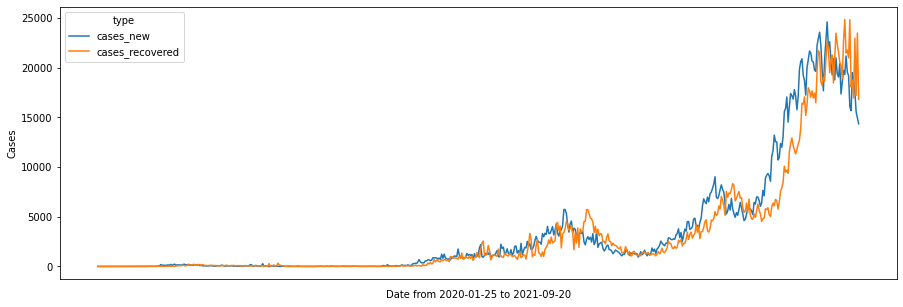

In [ ]:
#relationship between recovered cases, new cases
df2 = pd.DataFrame(data = df_msia, columns = ['date','cases_new','cases_recovered'])
df2 = df2.melt('date', var_name='type',  value_name='vals')
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="vals", hue='type', data=df2)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_cases_mysia['date'].unique()[0]+" to "+df_cases_mysia['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False)  # remove the ticks



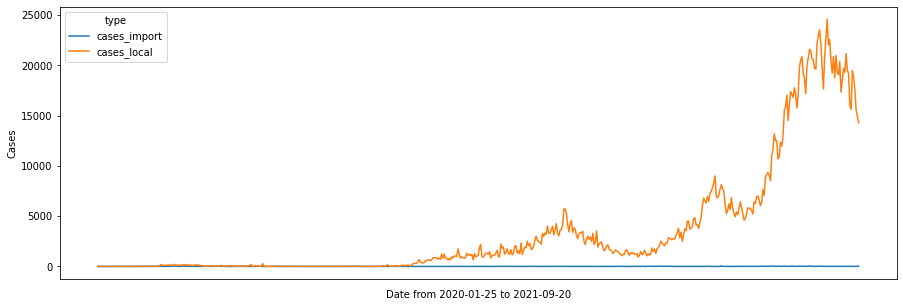

In [ ]:
#relationship between recovered cases, import cases
df_msia['cases_local'] = df_msia['cases_new'] - df_msia['cases_import']
df2 = pd.DataFrame(data = df_msia, columns = ['date','cases_import','cases_local'])
df2 = df2.melt('date', var_name='type',  value_name='vals')
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="vals", hue='type', data=df2)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_cases_mysia['date'].unique()[0]+" to "+df_cases_mysia['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False)  # remove the ticks

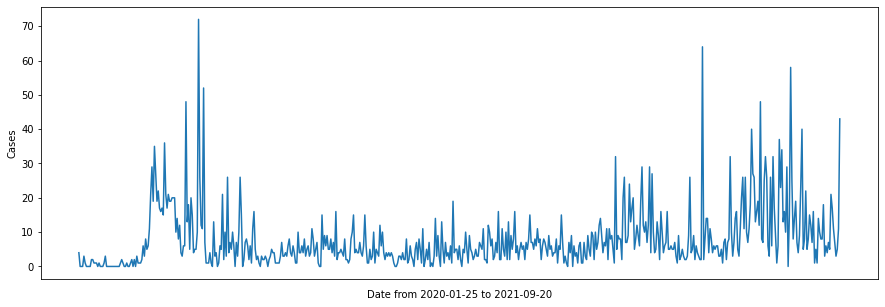

In [ ]:
#import cases in whole timeline
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="date", y="cases_import", data=df_msia)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_cases_mysia['date'].unique()[0]+" to "+df_cases_mysia['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False)  


 **Plot by month**

[Text(0, 0.5, 'Cases')]

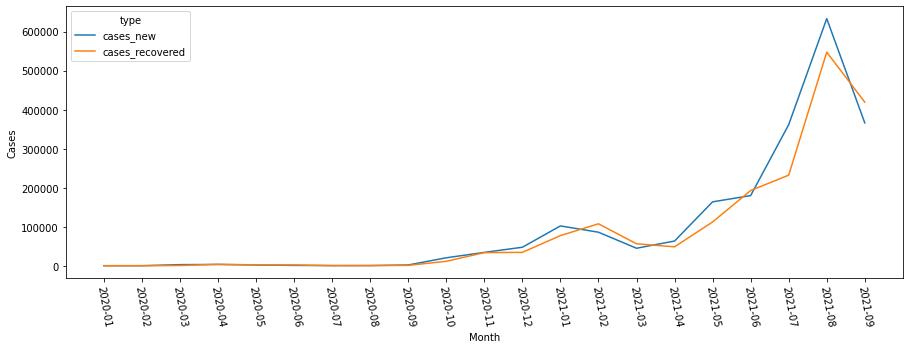

In [ ]:
#relationship between recovered cases, new cases per month
sum_my =pd.DataFrame(data = df_msia,columns = ['year_month','cases_new','cases_recovered'])
sum_my = sum_my.melt('year_month', var_name='type',  value_name='values')
sum_my =sum_my.groupby(['year_month','type']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="values", hue='type', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

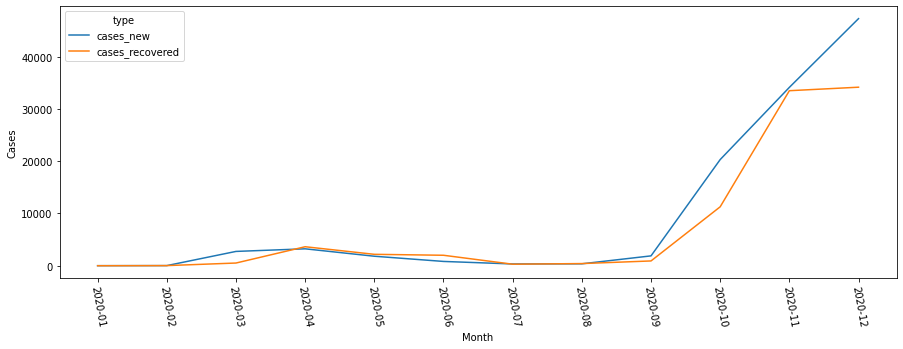

In [ ]:
#relationship between recovered cases, new cases per month in 2020
sum_my = df_msia.loc[df_msia['year']=='2020']
sum_my =pd.DataFrame(data = sum_my,columns = ['year_month','cases_new','cases_recovered'])
sum_my = sum_my.melt('year_month', var_name='type',  value_name='values')
sum_my =sum_my.groupby(['year_month','type']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="values", hue='type', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

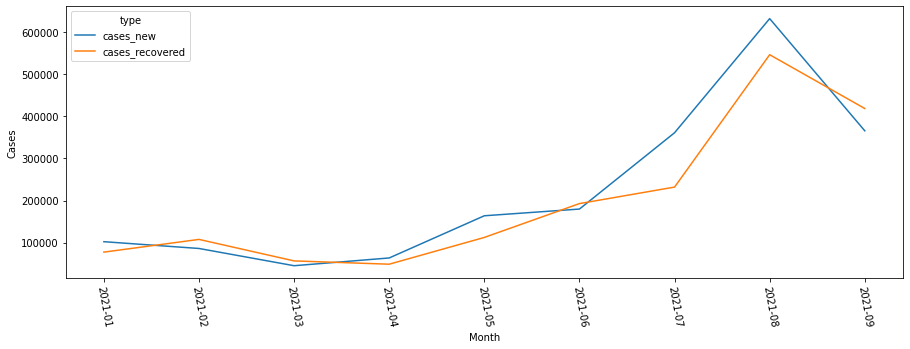

In [ ]:
#relationship between recovered cases, new cases per month in 2021
sum_my = df_msia.loc[df_msia['year']=='2021']
sum_my =pd.DataFrame(data = sum_my,columns = ['year_month','cases_new','cases_recovered'])
sum_my = sum_my.melt('year_month', var_name='type',  value_name='values')
sum_my =sum_my.groupby(['year_month','type']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="values", hue='type', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

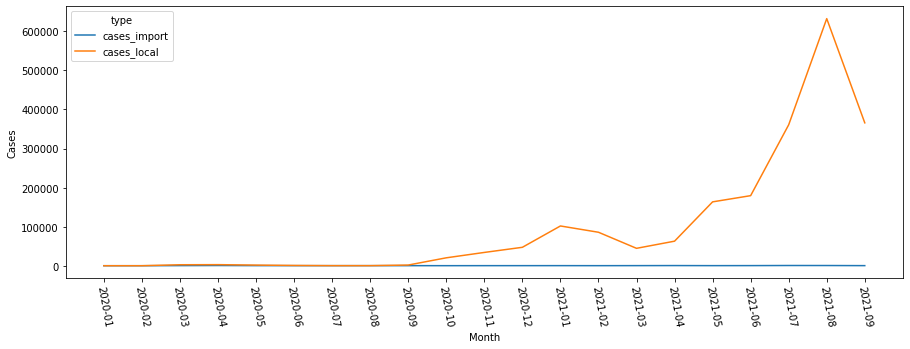

In [ ]:
#relationship between new cases ,import cases per month
sum_my =pd.DataFrame(data = df_msia,columns = ['year_month','cases_local','cases_import'])
sum_my = sum_my.melt('year_month', var_name='type',  value_name='values')
sum_my =sum_my.groupby(['year_month','type']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="values", hue='type', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

 **Compare 2020 and 2021**

[Text(0, 0.5, 'Cases')]

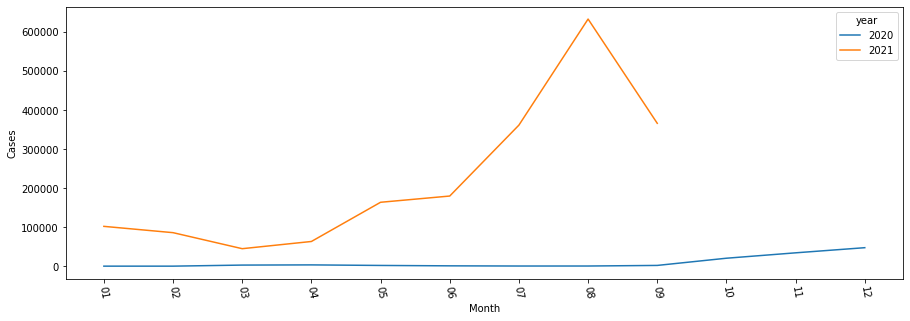

In [ ]:
#compare the new cases between 2020 and 2021 per month
sum_my =pd.DataFrame(data = df_msia,columns = ['year_month','cases_new','year','month'])
sum_my =sum_my.groupby(['year_month','year','month']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="month", y="cases_new", hue='year', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

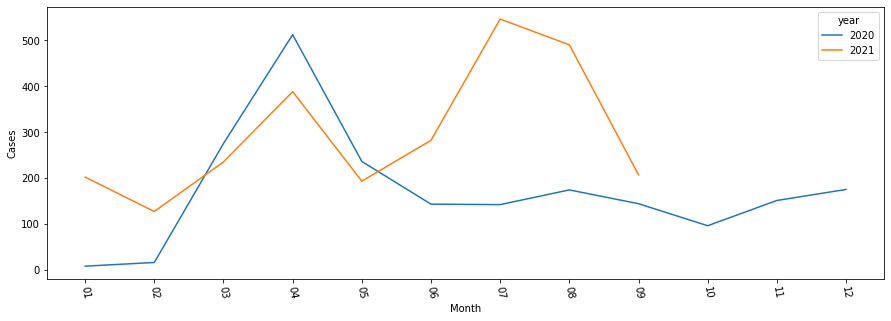

In [ ]:
#compare the import cases between 2020 and 2021 per month
sum_my =pd.DataFrame(data = df_msia,columns = ['year_month','cases_import','year','month'])
sum_my =sum_my.groupby(['year_month','year','month']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="month", y="cases_import", hue='year', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

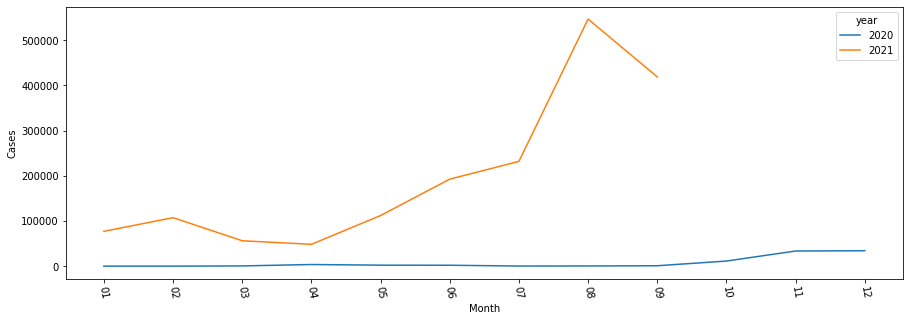

In [ ]:
#compare the recovered cases between 2020 and 2021 per month
sum_my =pd.DataFrame(data = df_msia,columns = ['year_month','cases_recovered','year','month'])
sum_my =sum_my.groupby(['year_month','year','month']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=1000)
g=sns.lineplot(x="month", y="cases_recovered", hue='year', data=sum_my)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

 **Show total cases in every state**

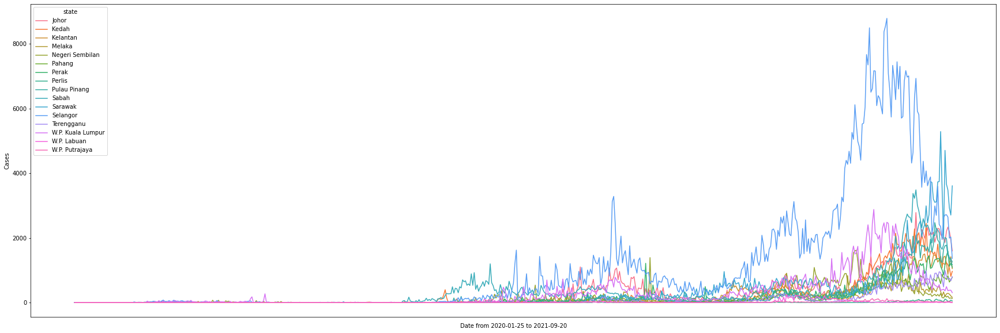

In [ ]:
#cases cases in whole timeline (states)
plt.figure(figsize=(30,10))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="cases_new", hue='state', data=df_state)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_state['date'].unique()[0]+" to "+df_state['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False) 

[Text(0, 0.5, 'Cases')]

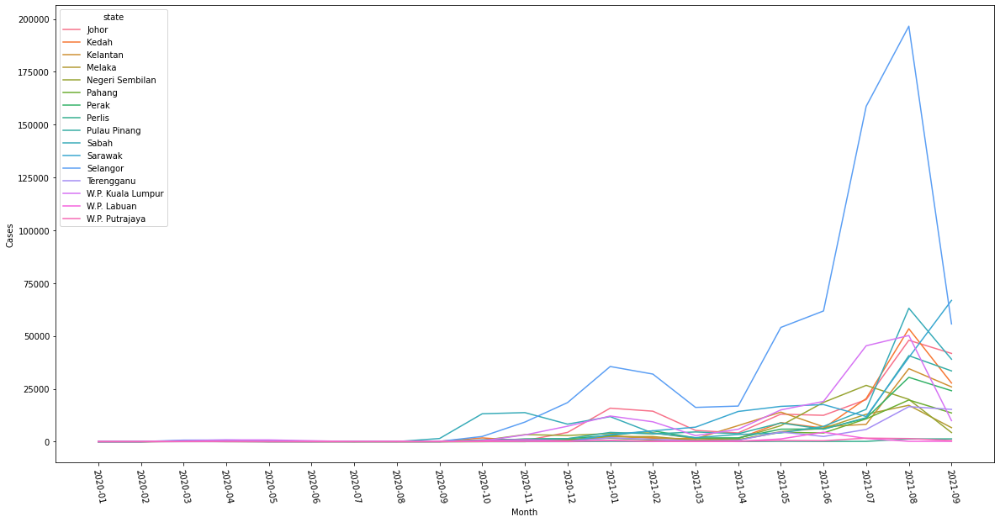

In [ ]:
#new cases by total per month (states)
sumdf=df_state.groupby(['year_month','state']).sum()
plt.figure(figsize=(20,10))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="cases_new", hue='state', data=sumdf)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

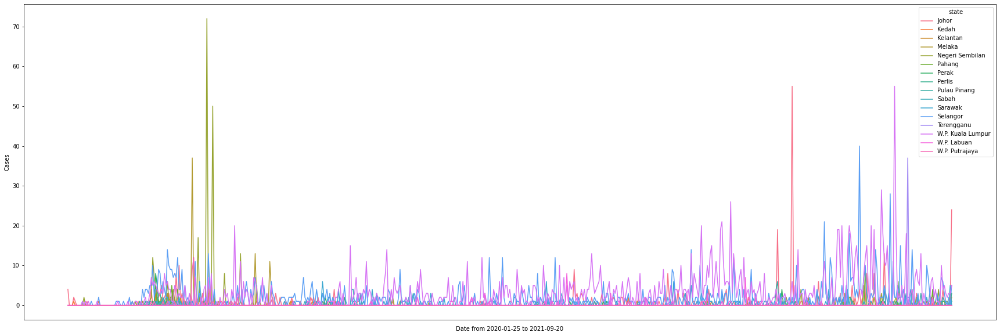

In [ ]:
#import cases in whole timeline (states)
plt.figure(figsize=(30,10))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="cases_import", hue='state', data=df_state)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_state['date'].unique()[0]+" to "+df_state['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False) 

[Text(0, 0.5, 'Cases')]

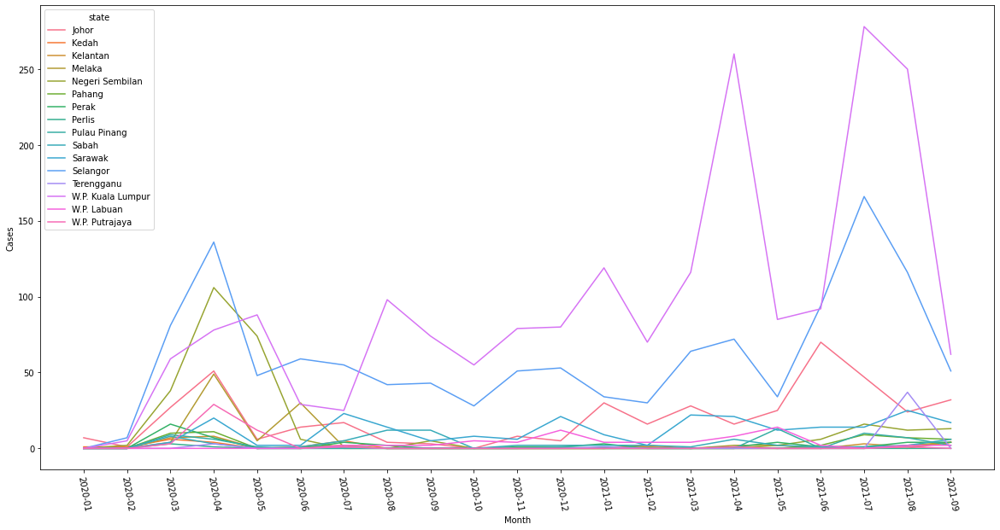

In [ ]:
#import cases by total per month (states)
sumdf=df_state.groupby(['year_month','state']).sum()
plt.figure(figsize=(20,10))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="cases_import", hue='state', data=sumdf)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

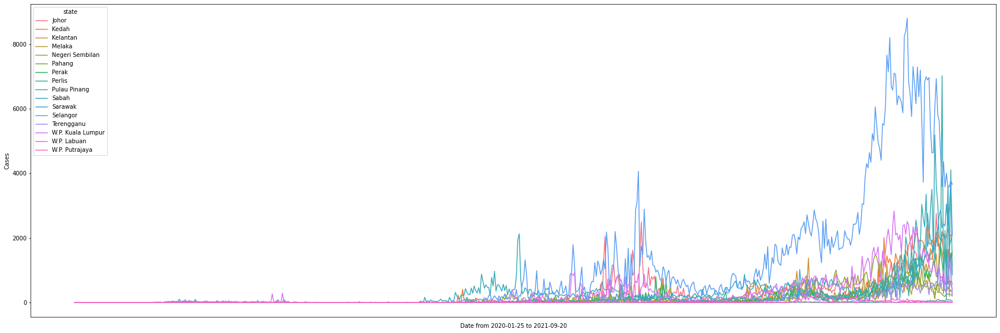

In [ ]:
#recovered cases in whole timeline (states)
plt.figure(figsize=(30,10))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="cases_recovered", hue='state', data=df_state)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_state['date'].unique()[0]+" to "+df_state['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False) 

[Text(0, 0.5, 'Cases')]

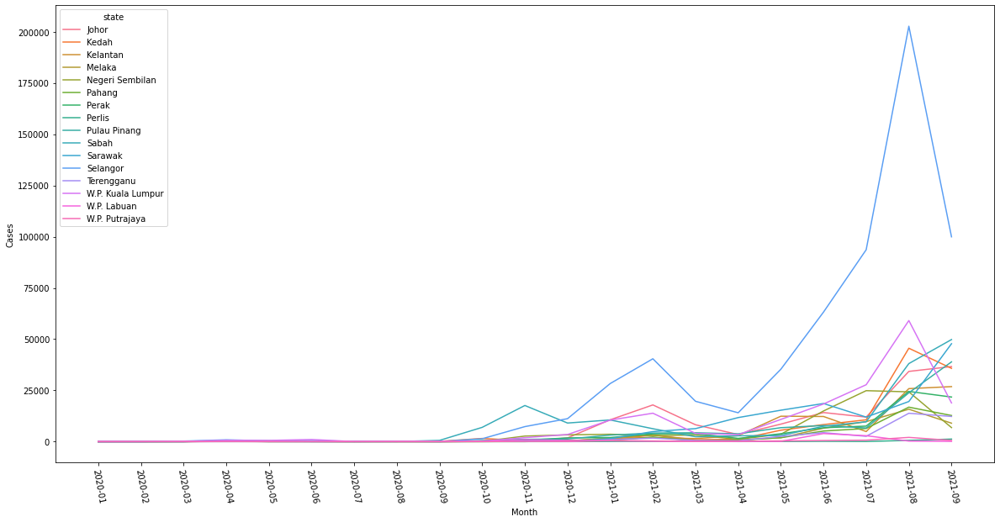

In [ ]:
#recovered cases by total per month (states)
sumdf=df_state.groupby(['year_month','state']).sum()
plt.figure(figsize=(20,10))
plt.xticks(rotation=1000)
g=sns.lineplot(x="year_month", y="cases_recovered", hue='state', data=sumdf)
g.set(xlabel='Month') 
g.set(ylabel='Cases')

In [ ]:
#sum up the total cases in every states
sum_my =pd.DataFrame(data = df_state,columns = ['cases_new','state'])
sum_my =sum_my.groupby(['state']).sum()

In [ ]:
#plot the map to show the total cases of every states
import altair as alt 
import folium
import geopandas as gp


df_map = gp.read_file('msia-states.json')
m = folium.Map([4.602973124617278, 108.64564992244625], zoom_start=5.5)
df_map['Cases'] = [sum_my.cases_new[0],sum_my.cases_new[1],sum_my.cases_new[2],sum_my.cases_new[13],
          sum_my.cases_new[14],sum_my.cases_new[3],sum_my.cases_new[4] ,sum_my.cases_new[5] ,
          sum_my.cases_new[6],sum_my.cases_new[7],sum_my.cases_new[8],sum_my.cases_new[15],
          sum_my.cases_new[9],sum_my.cases_new[10],sum_my.cases_new[11],sum_my.cases_new[12]]
bins = list(df_map["Cases"].quantile([0, 0.5, 0.75, 0.95, 1]))

states = folium.Choropleth(
    geo_data=df_map, 
    data=df_map,
    key_on="feature.properties.name_1",
    columns=['name_1',"Cases"],
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name="Cases",
    bins=bins,
    reset=True,
    ).add_to(m)


states.geojson.add_child(
    folium.features.GeoJsonTooltip(fields=['name_1', 'Cases'],aliases=['State: ','Cases: ']))

folium.TileLayer('Stamen Terrain').add_to(m)
folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('Stamen Water Color').add_to(m)
folium.TileLayer('cartodbpositron').add_to(m)
folium.TileLayer('cartodbdark_matter').add_to(m)
folium.LayerControl().add_to(m)


In [ ]:
m

[Text(0, 0.5, 'Cases')]

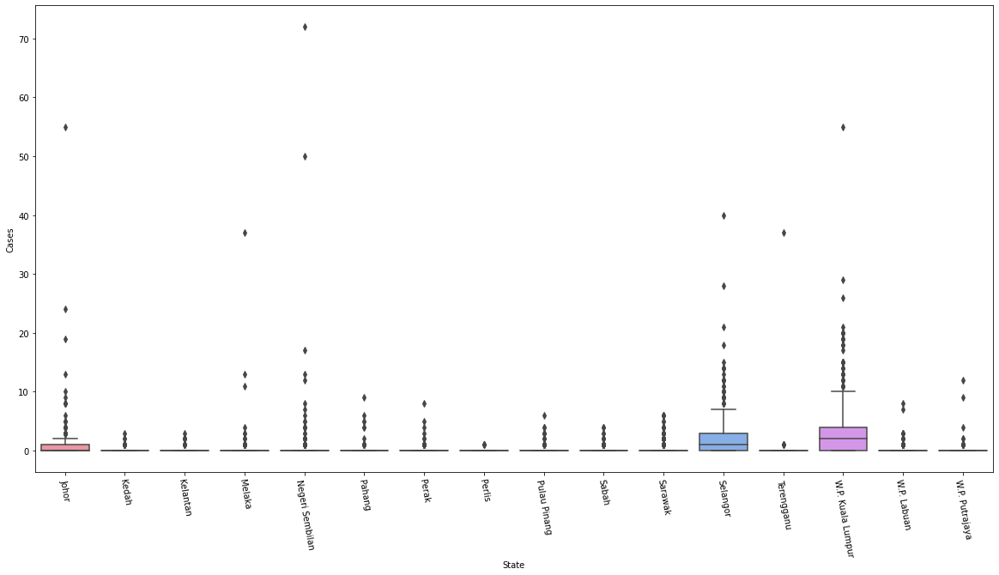

In [ ]:
#boxplot of import cases in every states to see the outliers
plt.figure(figsize=(20,10))
plt.xticks(rotation=1000)
g=sns.boxplot(y="cases_import", x='state', data=df_state)
g.set(xlabel='State') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

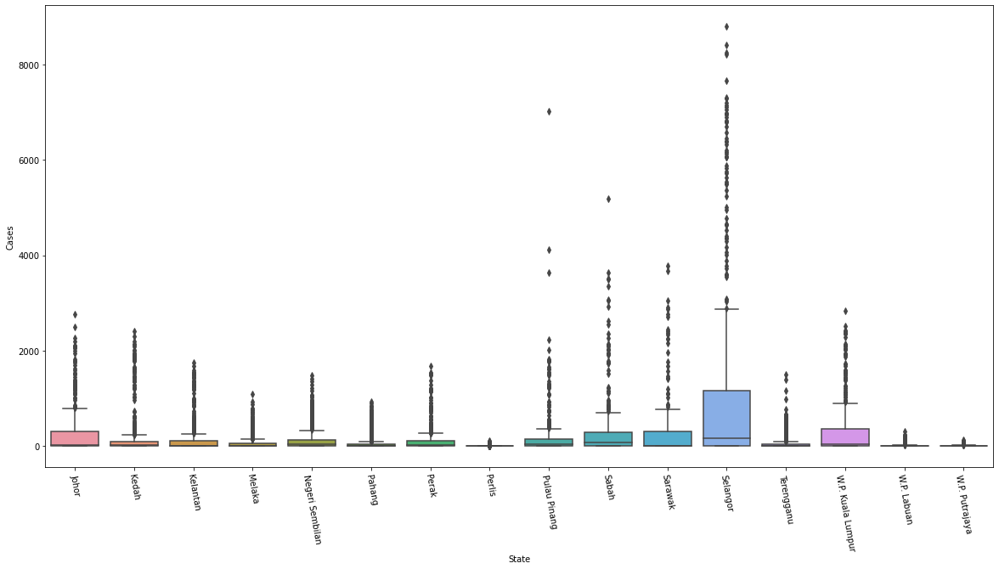

In [ ]:
#boxplot of recovered cases in every states to see the outliers
plt.figure(figsize=(20,10))
plt.xticks(rotation=1000)
g=sns.boxplot(y="cases_recovered", x='state', data=df_state)
g.set(xlabel='State') 
g.set(ylabel='Cases')

[Text(0, 0.5, 'Cases')]

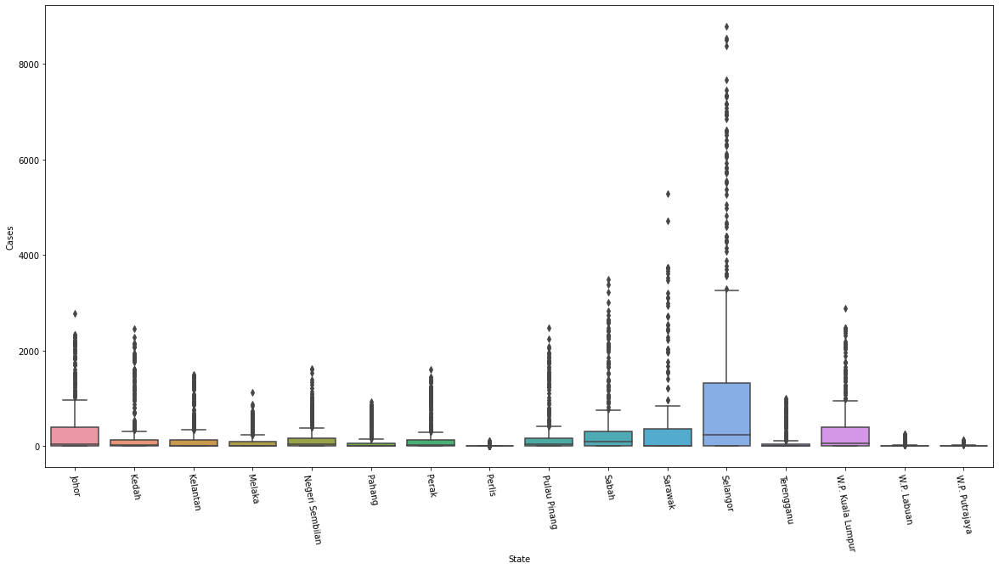

In [ ]:
#boxplot of new cases in every states to see the outliers
plt.figure(figsize=(20,10))
plt.xticks(rotation=1000)
g=sns.boxplot(y="cases_new", x='state', data=df_state)
g.set(xlabel='State') 
g.set(ylabel='Cases')

 **Covid Testing**

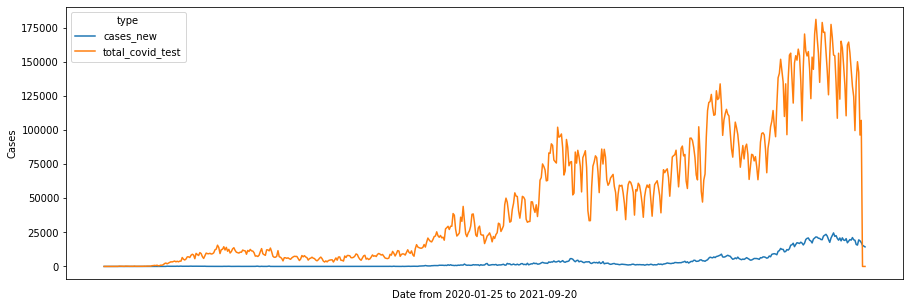

In [ ]:
#relationship between covid test and daily new cases
df_msia['total_covid_test']=df_msia['rtk-ag']+df_msia['pcr']
testcovid = pd.DataFrame(data = df_msia, columns = ['date','cases_new','total_covid_test'])
testcovid = testcovid.melt('date', var_name='type',  value_name='vals')
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="vals", hue='type', data=testcovid)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_cases_mysia['date'].unique()[0]+" to "+df_cases_mysia['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False) 

[Text(0, 0.5, 'Cases')]

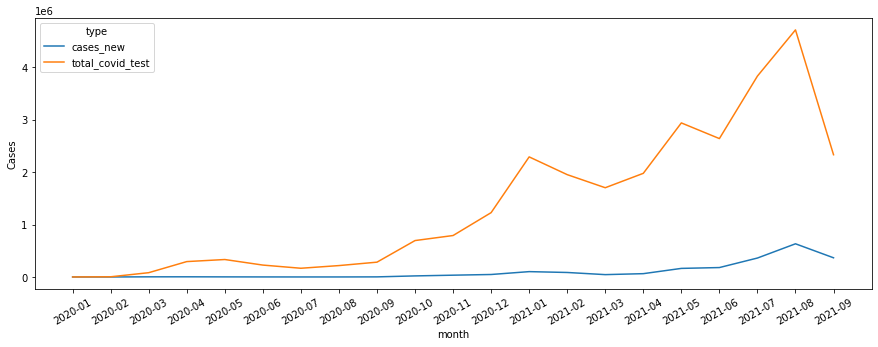

In [ ]:
#relationship between covid test and daily new cases
df_msia['total_covid_test']=df_msia['rtk-ag']+df_msia['pcr']
testcovid = pd.DataFrame(data = df_msia, columns = ['year_month','cases_new','total_covid_test'])

testcovid = testcovid.melt('year_month', var_name='type',  value_name='vals')
testcovid =testcovid.groupby(['year_month','type']).sum()
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="year_month", y="vals", hue='type', data=testcovid)
 
g.set(xlabel='month') 
g.set(ylabel='Cases')  


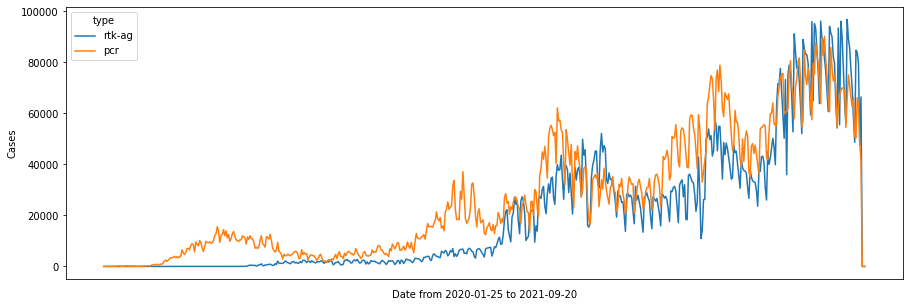

In [ ]:
#relationship between covid test and daily new cases
testcovid = pd.DataFrame(data = df_msia, columns = ['date','rtk-ag','pcr'])
testcovid = testcovid.melt('date', var_name='type',  value_name='vals')
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="vals", hue='type', data=testcovid)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_cases_mysia['date'].unique()[0]+" to "+df_cases_mysia['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False) 

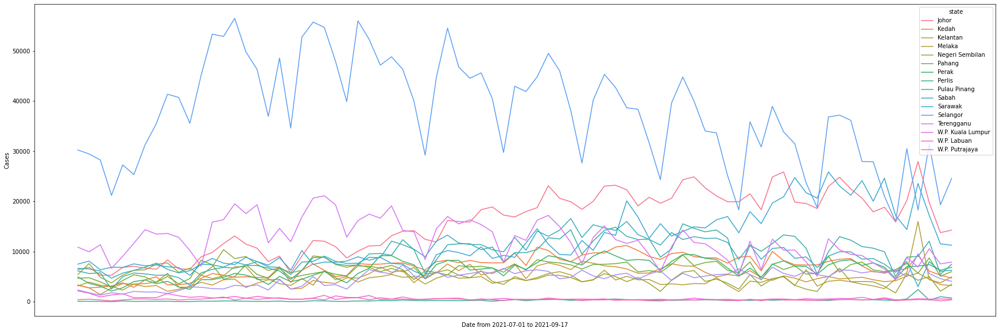

In [ ]:
#covid test in whole timeline (states)
df_test_state['total_covid_test']=df_test_state['rtk-ag']+df_test_state['pcr']
plt.figure(figsize=(30,10))
plt.xticks(rotation=30)
g =sns.lineplot(x="date", y="total_covid_test", hue='state', data=df_test_state)
g.set(xticklabels=[])  
g.set(xlabel='Date from '+df_test_state['date'].unique()[0]+" to "+df_test_state['date'].unique()[-1]) 
g.set(ylabel='Cases')  
g.tick_params(bottom=False)  

 **Cluster**

In [ ]:
#differentiate the cluster by year
cluster_2020=df_clusters.loc[df_clusters['a_year']=='2020']
cluster_2021=df_clusters.loc[df_clusters['a_year']=='2021']
cluster_count_2021 =df_clusters['a_year'].loc[df_clusters['a_year']=='2021'].count()
cluster_count_2020 =df_clusters['a_year'].loc[df_clusters['a_year']=='2020'].count()
cluster_active_2021 = cluster_2021['status'].loc[cluster_2021['status']=='active'].count()
cluster_active_2020 = cluster_2020['status'].loc[cluster_2020['status']=='active'].count()
cluster_ended_2021 = cluster_2021['status'].loc[cluster_2021['status']=='ended'].count()
cluster_ended_2020 = cluster_2020['status'].loc[cluster_2020['status']=='ended'].count()


[Text(0, 0.5, 'Total')]

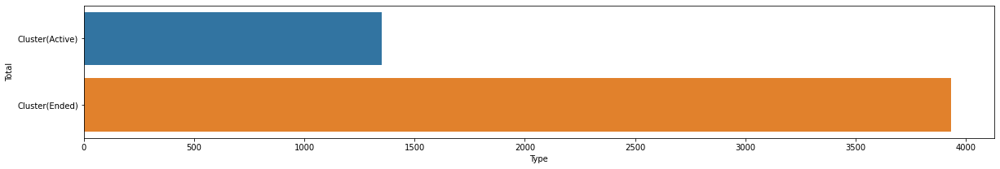

In [ ]:
#count the active and ended cluster
cluster_active = df_clusters['status'].loc[df_clusters['status']=='active'].count()
cluster_ended = df_clusters['status'].loc[df_clusters['status']=='ended'].count()
data = {'Type': ['Cluster(Active)', 'Cluster(Ended)'], 'Total': [cluster_active,cluster_ended]}  
sum_df =pd.DataFrame(data = data,columns = ['Type','Total'])
plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
g=sns.barplot(x='Total',y='Type',data=sum_df)
g.set(xlabel='Type') 
g.set(ylabel='Total') 

In [ ]:
count = df_clusters.groupby(['category','a_year_month']).count()

[Text(0, 0.5, 'Total')]

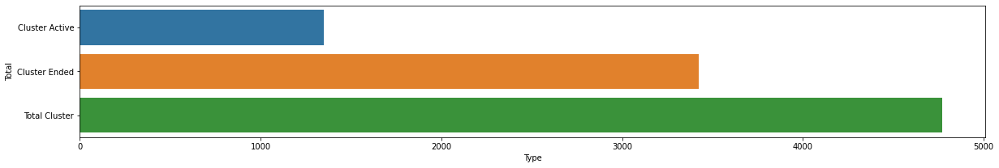

In [ ]:
#count the active and ended cluster in 2021
data = {'Type': ['Cluster Active', 'Cluster Ended','Total Cluster'], 'Total': [cluster_active_2021,cluster_ended_2021,cluster_count_2021]}  
sum_df =pd.DataFrame(data = data,columns = ['Type','Total'])
plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
g=sns.barplot(x='Total',y='Type',data=sum_df)
g.set(xlabel='Type') 
g.set(ylabel='Total') 

[Text(0, 0.5, 'Total')]

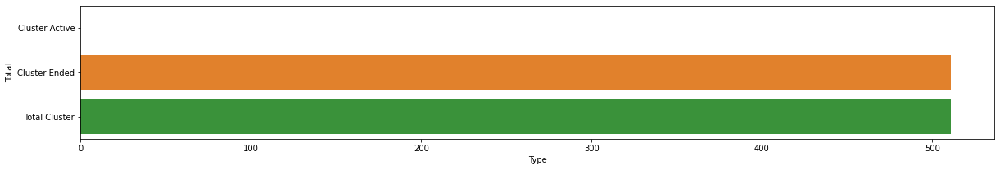

In [ ]:
#count the active and ended cluster in 2020
data = {'Type': ['Cluster Active', 'Cluster Ended','Total Cluster'], 'Total': [cluster_active_2020,cluster_ended_2020,cluster_count_2020]}  
sum_df =pd.DataFrame(data = data,columns = ['Type','Total'])
plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
g=sns.barplot(x='Total',y='Type',data=sum_df)
g.set(xlabel='Type') 
g.set(ylabel='Total') 

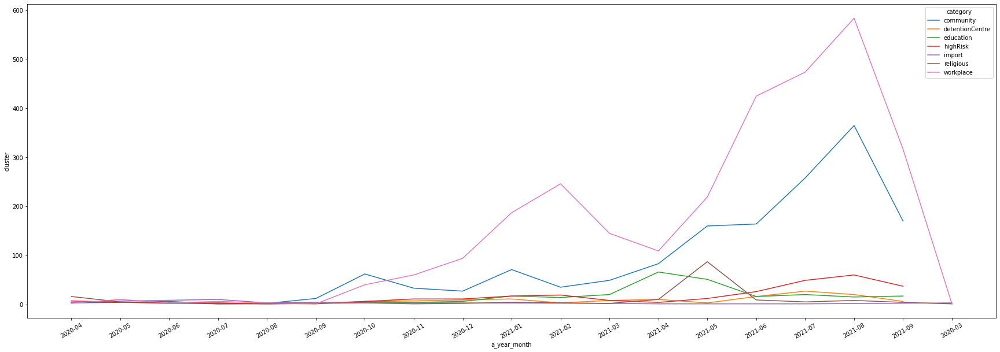

In [ ]:
#Number of cluster by category in every month
plt.figure(figsize=(30,10))
plt.xticks(rotation=30)
g =sns.lineplot(x="a_year_month", y="cluster", hue='category', data=count)
g 

[Text(0, 0.5, 'Cases')]

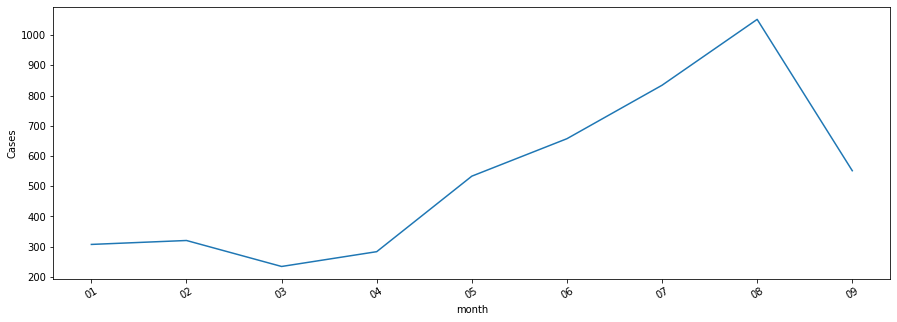

In [ ]:
#Number of cluster by category in every month in 2021
cluster = df_clusters.loc[df_clusters['a_year']=='2021']
cluster= cluster.groupby(['a_year_month','a_year','a_month']).count()
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="a_month", y="cluster", data=cluster)
g.set(xlabel='month') 
g.set(ylabel='Cases') 


[Text(0, 0.5, 'Cases')]

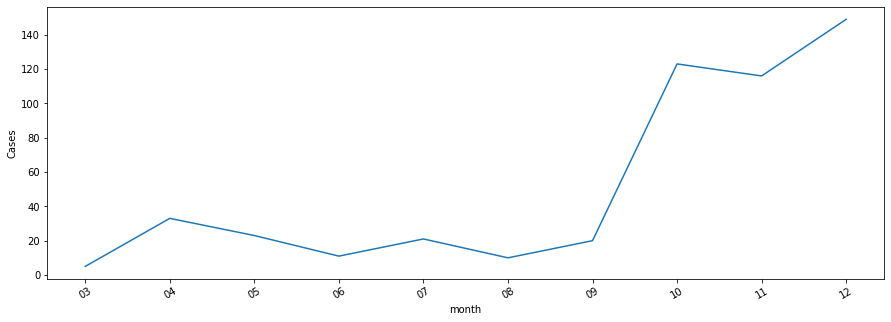

In [ ]:
#Number of cluster by category in every month in 2020
cluster = df_clusters.loc[df_clusters['a_year']=='2020']
cluster= cluster.groupby(['a_year_month','a_year','a_month']).count()
plt.figure(figsize=(15,5))
plt.xticks(rotation=30)
g =sns.lineplot(x="a_month", y="cluster", data=cluster)
g.set(xlabel='month') 
g.set(ylabel='Cases') 


# **Question 2 : Correlation**

In [ ]:
#drop unused column
df_test_state.drop(['total_covid_test'], axis=1,inplace=True)

In [ ]:
#states of Malaysia
state_list =['Johor','Kedah','Kelantan','Melaka','Negeri Sembilan','Pahang','Pulau Pinang','Perak','Perlis','Sabah','Sarawak','Selangor','Terengganu','W.P. Kuala Lumpur','W.P. Labuan','W.P. Putrajaya']
statedf =[]


In [ ]:
#reset the index of df_cases_state into specific states
statedf=[]
johor=df_cases_state[df_cases_state['state']=='Johor'].reset_index()
pahang=df_cases_state[df_cases_state['state']=='Pahang'].reset_index()
for x in state_list:
  statedf.append(df_cases_state[df_cases_state['state']==x].reset_index())

In [ ]:
#create dataframe
PahangDf =pd.DataFrame()
JohorDf =pd.DataFrame()

In [ ]:
for i in statedf:
  PahangDf[i['state'].loc[0]] = pahang.corrwith(i,axis =0)

In [ ]:
for i in statedf:
  JohorDf[i['state'].loc[0]] = johor.corrwith(i,axis =0)

In [ ]:
#reset the index of df_test_state into specific states
statedf=[]
johor_test=df_test_state[df_test_state['state']=='Johor'].reset_index()
pahang_test=df_test_state[df_test_state['state']=='Pahang'].reset_index()
for x in state_list:
  statedf.append(df_test_state[df_test_state['state']==x].reset_index())

In [ ]:
#create data frame
Johor_test =pd.DataFrame()
Pahang_test =pd.DataFrame()

In [ ]:
#count correlation between johor and other states
for i in statedf:
  Johor_test[i['state'].loc[0]] = johor_test.corrwith(i,axis =0)

In [ ]:
#count correlation between pahang and other states
for i in statedf:
  Pahang_test[i['state'].loc[0]] = pahang_test.corrwith(i,axis =0)

In [ ]:
Pahang_test =Pahang_test.T
Johor_test =Johor_test.T
PahangDf =PahangDf.T
JohorDf =JohorDf.T

In [ ]:
#merge the dataframe
Pahang = pd.merge(PahangDf,Pahang_test, left_index=True, right_index=True)
Johor = pd.merge(JohorDf,Johor_test, left_index=True, right_index=True)

In [ ]:
#drop index column
Pahang.drop(['index_x','index_y'], axis=1,inplace=True)
Pahang

,cases_import,cases_new,cases_recovered,rtk-ag,pcr
Johor,0.007395,0.904386,0.800317,0.325882,0.638992
Kedah,0.224929,0.935103,0.929277,0.394173,0.616496
Kelantan,0.110820,0.903425,0.867557,0.149062,0.294741
Melaka,0.005503,0.853518,0.832637,0.074119,-0.112198
Negeri Sembilan,0.029199,0.610615,0.682988,0.540062,-0.496706
Pahang,1.000000,1.000000,1.000000,1.000000,1.000000
Pulau Pinang,0.061726,0.905884,0.722928,0.473330,0.480813
Perak,0.254180,0.916947,0.890634,0.496498,0.341456
Perlis,0.161813,0.770746,0.744097,-0.038671,0.424741
Sabah,0.011455,0.845192,0.762783,0.517400,0.321582


In [ ]:
Johor.drop(['index_x','index_y'], axis=1,inplace=True)
Johor

,cases_import,cases_new,cases_recovered,rtk-ag,pcr
Johor,1.000000,1.000000,1.000000,1.000000,1.000000
Kedah,0.142780,0.895056,0.817140,0.760515,0.808514
Kelantan,0.086145,0.903087,0.813039,0.616444,0.245869
Melaka,0.008807,0.766868,0.700323,0.526037,-0.131204
Negeri Sembilan,-0.005022,0.493619,0.550111,0.254076,-0.554942
Pahang,0.007395,0.904386,0.800317,0.325882,0.638992
Pulau Pinang,0.181402,0.931598,0.710294,0.665735,0.828142
Perak,0.118488,0.930467,0.838928,0.774365,0.561361
Perlis,-0.013269,0.826687,0.759275,0.515244,0.776747
Sabah,0.081198,0.871000,0.746444,0.617819,0.452873


# **END OF CODE**

**Done by Chang Kai Boon and Soe Zhao Hong**